## 卷积神经网络（Convolutional Neural Network, CNN）

## 项目：实现一个狗品种识别算法App
---
推荐你阅读以下材料来加深对 CNN和Transfer Learning的理解:
* [CS231n: Convolutional Neural Networks for Visual Recognition](http://cs231n.stanford.edu/)
* [Using Convolutional Neural Networks to Classify Dog Breeds](http://cs231n.stanford.edu/reports/2015/pdfs/fcdh_FinalReport.pdf)
* [Building an Image Classifier](https://towardsdatascience.com/learning-about-data-science-building-an-image-classifier-part-2-a7bcc6d5e825)
* [Tips/Tricks in CNN](http://lamda.nju.edu.cn/weixs/project/CNNTricks/CNNTricks.html)
* [Transfer Learning using Keras](https://towardsdatascience.com/transfer-learning-using-keras-d804b2e04ef8)
* [Transfer Learning in TensorFlow on the Kaggle Rainforest competition](https://medium.com/@luckylwk/transfer-learning-in-tensorflow-on-the-kaggle-rainforest-competition-4e978fadb571)
* [Transfer Learning and Fine-tuning](https://deeplearningsandbox.com/how-to-use-transfer-learning-and-fine-tuning-in-keras-and-tensorflow-to-build-an-image-recognition-94b0b02444f2)
* [Building powerful image classification models using very little data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html)
* [简述迁移学习在深度学习中的应用](https://www.jiqizhixin.com/articles/2018-01-04-7)
* [无需数学背景，读懂 ResNet、Inception 和 Xception 三大变革性架构](https://www.jiqizhixin.com/articles/2017-08-19-4)

相关论文：
* [[VGG16] VERY DEEP CONVOLUTIONAL NETWORKS FOR LARGE-SCALE IMAGE RECOGNITION](https://arxiv.org/abs/1409.1556)
* [[Inception-v1] Going deeper with convolutions](https://arxiv.org/abs/1409.4842)
* [[Inception-v3] Rethinking the Inception Architecture for Computer Vision](https://arxiv.org/abs/1512.00567)
* [[Inception-v4] Inception-ResNet and the Impact of Residual Connections on Learning](https://arxiv.org/abs/1602.07261)
* [https://arxiv.org/abs/1512.03385](https://arxiv.org/abs/1512.03385)
* [[Xception] Deep Learning with Depthwise Separable Convolutions](https://arxiv.org/abs/1610.02357)
### 让我们开始吧
在这个notebook中，你将迈出第一步，来开发可以作为移动端或 Web应用程序一部分的算法。在这个项目的最后，你的程序将能够把用户提供的任何一个图像作为输入。如果可以从图像中检测到一只狗，它会输出对狗品种的预测。如果图像中是一个人脸，它会预测一个与其最相似的狗的种类。下面这张图展示了完成项目后可能的输出结果。（……实际上我们希望每个学生的输出结果不相同！）

![Sample Dog Output](images/sample_dog_output.png)

在现实世界中，你需要拼凑一系列的模型来完成不同的任务；举个例子，用来预测狗种类的算法会与预测人类的算法不同。在做项目的过程中，你可能会遇到不少失败的预测，因为并不存在完美的算法和模型。你最终提交的不完美的解决方案也一定会给你带来一个有趣的学习经验！

### 项目内容

我们将这个notebook分为不同的步骤，你可以使用下面的链接来浏览此notebook。

* [Step 0](#step0): 导入数据集
* [Step 1](#step1): 检测人脸
* [Step 2](#step2): 检测狗狗
* [Step 3](#step3): 从头创建一个CNN来分类狗品种
* [Step 4](#step4): 使用一个CNN来区分狗的品种(使用迁移学习)
* [Step 5](#step5): 建立一个CNN来分类狗的品种（使用迁移学习）
* [Step 6](#step6): 完成你的算法
* [Step 7](#step7): 测试你的算法

在该项目中包含了如下的问题：

* [问题 1](#question1)
* [问题 2](#question2)
* [问题 3](#question3)
* [问题 4](#question4)
* [问题 5](#question5)
* [问题 6](#question6)
* [问题 7](#question7)
* [问题 8](#question8)
* [问题 9](#question9)
* [问题 10](#question10)
* [问题 11](#question11)


---
<a id='step0'></a>
## 步骤 0: 导入数据集

### 导入狗数据集
在下方的代码单元（cell）中，我们导入了一个狗图像的数据集。我们使用 scikit-learn 库中的 `load_files` 函数来获取一些变量：
- `train_files`, `valid_files`, `test_files` - 包含图像的文件路径的numpy数组
- `train_targets`, `valid_targets`, `test_targets` - 包含独热编码分类标签的numpy数组
- `dog_names` - 由字符串构成的与标签相对应的狗的种类

In [1]:
from sklearn.datasets import load_files       
from tensorflow.keras.utils import to_categorical
import numpy as np
from glob import glob

# 定义函数来加载train，test和validation数据集
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# 加载train，test和validation数据集
train_files, train_targets = load_dataset('dogImages/train')
valid_files, valid_targets = load_dataset('dogImages/valid')
test_files, test_targets = load_dataset('dogImages/test')

# 加载狗品种列表
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]

# 打印数据统计描述
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

ImportError: No module named 'tensorflow'

**note:**
* glob.glob返回一个包含指定目录下的所有文件夹或文件的字符串数组
* np.hstack在横向拼接array数组；np.vstack在纵向拼接array数组

### 导入人脸数据集

在下方的代码单元中，我们导入人脸图像数据集，文件所在路径存储在名为 `human_files` 的 numpy 数组。

In [2]:
import random
random.seed(8675309)

# 加载打乱后的人脸数据集的文件名
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)

# 打印数据集的数据量
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


---
<a id='step1'></a>
## 步骤1：检测人脸
 
我们将使用 OpenCV 中的 [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) 来检测图像中的人脸。OpenCV 提供了很多预训练的人脸检测模型，它们以XML文件保存在 [github](https://github.com/opencv/opencv/tree/master/data/haarcascades)。我们已经下载了其中一个检测模型，并且把它存储在 `haarcascades` 的目录中。

在如下代码单元中，我们将演示如何使用这个检测模型在样本图像中找到人脸。

Number of faces detected: 1


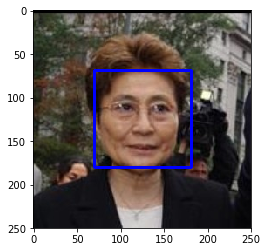

In [3]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# 提取预训练的人脸检测模型
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# 加载彩色（通道顺序为BGR）图像
img = cv2.imread(human_files[1])

# img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

# 将BGR图像进行灰度处理
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 在图像中找出脸
faces = face_cascade.detectMultiScale(gray)

# 打印图像中检测到的脸的个数
print('Number of faces detected:', len(faces))

# 获取每一个所检测到的脸的识别框
for (x,y,w,h) in faces:
    # 在人脸图像中绘制出识别框
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# 将BGR图像转变为RGB图像以打印
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 展示含有识别框的图像
plt.imshow(cv_rgb)
plt.show()

在使用任何一个检测模型之前，将图像转换为灰度图是常用过程。`detectMultiScale` 函数使用储存在 `face_cascade` 中的的数据，对输入的灰度图像进行分类。

在上方的代码中，`faces` 以 numpy 数组的形式，保存了识别到的面部信息。它其中每一行表示一个被检测到的脸，该数据包括如下四个信息：前两个元素  `x`、`y` 代表识别框左上角的 x 和 y 坐标（参照上图，注意 y 坐标的方向和我们默认的方向不同）；后两个元素代表识别框在 x 和 y 轴两个方向延伸的长度 `w` 和 `d`。 

### 写一个人脸识别器

我们可以将这个程序封装为一个函数。该函数的输入为人脸图像的**路径**，当图像中包含人脸时，该函数返回 `True`，反之返回 `False`。该函数定义如下所示。

In [4]:
# 如果img_path路径表示的图像检测到了脸，返回"True" 
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### **【练习】** 评估人脸检测模型


---

<a id='question1'></a>
### __问题 1:__ 

在下方的代码块中，使用 `face_detector` 函数，计算：

- `human_files` 的前100张图像中，能够检测到**人脸**的图像占比多少？
- `dog_files` 的前100张图像中，能够检测到**人脸**的图像占比多少？

理想情况下，人图像中检测到人脸的概率应当为100%，而狗图像中检测到人脸的概率应该为0%。你会发现我们的算法并非完美，但结果仍然是可以接受的。我们从每个数据集中提取前100个图像的文件路径，并将它们存储在`human_files_short`和`dog_files_short`中。

In [5]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
## 请不要修改上方代码


## TODO: 基于human_files_short和dog_files_short
## 中的图像测试face_detector的表现
count_human = 0
count_dog = 0
for human_file in human_files_short:
    if face_detector(human_file):
        count_human += 1

for dog_file in dog_files_short:
    if face_detector(dog_file):
        count_dog += 1
        
print("the percentage of detected human faces from human_files is: %.2f%%" % ((count_human / len(human_files_short))*100))
print("the percentage of detected human faces from dog_files is: %.2f%%" % ((count_dog / len(dog_files_short))*100))

the percentage of detected human faces from human_files is: 99.00%
the percentage of detected human faces from dog_files is: 12.00%


简化代码：

In [6]:
def check_file(detector, img_paths):
    return np.mean(list(map(detector, img_paths)))

In [7]:
print('human: {:.2%}'.format(check_file(face_detector, human_files_short)))
print('dog: {:.2%}'.format(check_file(face_detector, dog_files_short)))

human: 99.00%
dog: 12.00%


---

<a id='question2'></a>

### __问题 2:__ 

就算法而言，该算法成功与否的关键在于，用户能否提供含有清晰面部特征的人脸图像。
那么你认为，这样的要求在实际使用中对用户合理吗？如果你觉得不合理，你能否想到一个方法，即使图像中并没有清晰的面部特征，也能够检测到人脸？

__回答:__

要求用户提供含有清晰面部特征的人脸图像是不合理的，因为用户不可能随时处在于一个光线充足、摄像头像素较高的条件下，因此，在设计人脸检测算法的时候应该充分考虑到环境的干扰。可以考虑使用深度学习进行人脸检测


**小结:**

实际上，这个问题需要分情况来探讨。一方面我们要提升自己的算法来应对各种情况的输入图像，提升用户使用体验。而另一方面，在一些特定场景下，我们也需要对用户提出要求，尤其是在安全相关的领域。比如，在人脸识别解锁、支付等场景下，为了保证安全性，我们需要要求用户正脸面对镜头，并且不能佩戴口罩等遮挡物。

进一步提升人脸识别的准确度，可以尝试[HOG(Histograms of Oriented Gradients)](https://www.learnopencv.com/histogram-of-oriented-gradients/)或一些基于深度学习的算法，如[YOLO(Real-Time Object Detection algorithm)](https://arxiv.org/abs/1506.02640)、[FaceNet](https://arxiv.org/abs/1503.03832)、[MTCNN](https://medium.com/wassa/modern-face-detection-based-on-deep-learning-using-python-and-mxnet-5e6377f22674)等。

此外，你可以使用[imgaug](https://github.com/aleju/imgaug)来对训练集进行增强、扩充，以增加训练集中的多样性。

补充材料：
* [Tutorial - Face Detection using Haar Cascades](https://docs.opencv.org/3.3.0/d7/d8b/tutorial_py_face_detection.html)
* [Face Detection using OpenCV](https://www.superdatascience.com/opencv-face-detection/)
* [OpenCV Face Detection in Images using Haar Cascades with Face Count](https://shahsparx.me/opencv-face-detection-haar-cascades/)
* [YouTube video - Haar Cascade Object Detection Face & Eye](https://www.youtube.com/watch?v=88HdqNDQsEk)
* [Haar caascade classifiers](https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Object_Detection_Face_Detection_Haar_Cascade_Classifiers.php)
* [YouTube video - VIOLA JONES FACE DETECTION EXPLAINED](https://www.youtube.com/watch?v=_QZLbR67fUU)
* [How can I understand Haar-like feature for face detection?](https://www.quora.com/How-can-I-understand-Haar-like-feature-for-face-detection)
* [A simple facial recognition api for Python and the command line](https://github.com/ageitgey/face_recognition)
* 这个知乎专栏介绍了[目前主流的基于深度学习的人脸识别算法](https://zhuanlan.zhihu.com/p/24816781)。

---

<a id='Selection1'></a>
### 选做：

我们建议在你的算法中使用opencv的人脸检测模型去检测人类图像，不过你可以自由地探索其他的方法，尤其是尝试使用深度学习来解决它:)。请用下方的代码单元来设计和测试你的面部监测算法。如果你决定完成这个_选做_任务，你需要报告算法在每一个数据集上的表现。

In [8]:
## (选做) TODO: 报告另一个面部检测算法在LFW数据集上的表现
### 你可以随意使用所需的代码单元数
import cv2
import matplotlib.pyplot as plt
import time
%matplotlib inline

def convertToRGB(img): # 将BGR转换成RGB,供plt显示图像
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def detect_faces(f_cascade, e_cascade,  colored_img, scaleFactor=1.2):

    height, width = 250, 250
    color_img = cv2.resize(colored_img, (height, width))
    gray_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2GRAY)
    
    # plt.imshow(gray_img, cmap='gray')
    # plt.show()
    
    # cv2.imshow('test image', gray_img)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()

    faces = f_cascade.detectMultiScale(gray_img, scaleFactor, minNeighbors=5)
    
    print('faces found: ', len(faces))
    for (x, y, w, h) in faces:
        cv2.rectangle(color_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
        roi_gray = gray_img[y:y+h, x:x+w]
        roi_color = color_img[y:y+h, x:x+w]
        eyes = e_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (255, 0, 0), 2)
    
    return color_img

faces found:  1


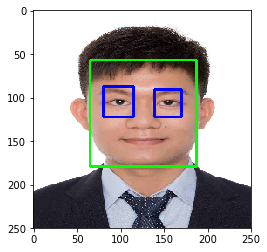

In [9]:
test1 = cv2.imread('testImages/human/human1.jpg')
haar_face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt2.xml')
haar_eye_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_eye.xml')
faces_detected_img = detect_faces(haar_face_cascade, haar_eye_cascade, test1)

plt.imshow(convertToRGB(faces_detected_img))
plt.show()

In [10]:
def face_detector1(img_path):
    img = cv2.imread(img_path)
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = haar_face_cascade.detectMultiScale(gray_img, scaleFactor=1.3, minNeighbors=6)
    return len(faces) > 0

In [11]:
print('human: {:.2%}'.format(check_file(face_detector1, human_files_short)))
print('dog: {:.2%}'.format(check_file(face_detector1, dog_files_short)))

human: 90.00%
dog: 0.00%


---
<a id='step2'></a>

## 步骤 2: 检测狗狗

在这个部分中，我们使用预训练的 [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) 模型去检测图像中的狗。下方的第一行代码就是下载了 ResNet-50 模型的网络结构参数，以及基于 [ImageNet](http://www.image-net.org/) 数据集的预训练权重。

ImageNet 这目前一个非常流行的数据集，常被用来测试图像分类等计算机视觉任务相关的算法。它包含超过一千万个 URL，每一个都链接到 [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a) 中所对应的一个物体的图像。任给输入一个图像，该 ResNet-50 模型会返回一个对图像中物体的预测结果。

In [12]:
from tensorflow.keras.applications.resnet50 import ResNet50

# 定义ResNet50模型
Resnet50_model = ResNet50(weights='imagenet')

### 数据预处理

- 在使用 TensorFlow 作为后端的时候，在 Keras 中，CNN 的输入是一个4维数组（也被称作4维张量），它的各维度尺寸为 `(nb_samples, rows, columns, channels)`。其中 `nb_samples` 表示图像（或者样本）的总数，`rows`, `columns`, 和 `channels` 分别表示图像的行数、列数和通道数。


- 下方的 `path_to_tensor` 函数实现如下将彩色图像的字符串型的文件路径作为输入，返回一个4维张量，作为 Keras CNN 输入。因为我们的输入图像是彩色图像，因此它们具有三个通道（ `channels` 为 `3`）。
    1. 该函数首先读取一张图像，然后将其缩放为 224×224 的图像。
    2. 随后，该图像被调整为具有4个维度的张量。
    3. 对于任一输入图像，最后返回的张量的维度是：`(1, 224, 224, 3)`。


- `paths_to_tensor` 函数将图像路径的字符串组成的 numpy 数组作为输入，并返回一个4维张量，各维度尺寸为 `(nb_samples, 224, 224, 3)`。 在这里，`nb_samples`是提供的图像路径的数据中的样本数量或图像数量。你也可以将 `nb_samples` 理解为数据集中3维张量的个数（每个3维张量表示一个不同的图像。

In [13]:
from tensorflow.keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # 用PIL加载RGB图像为PIL.Image.Image类型
    img = image.load_img(img_path, target_size=(224, 224))
    # 将PIL.Image.Image类型转化为格式为(224, 224, 3)的3维张量
    x = image.img_to_array(img)
    # 将3维张量转化为格式为(1, 224, 224, 3)的4维张量并返回
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors) # np.vstack将数组按照垂直方向叠加

* **Tqdm 是一个快速，可扩展的Python进度条，可以在 Python 长循环中添加一个进度提示信息，用户只需要封装任意的迭代器 tqdm(iterator)。**

### 基于 ResNet-50 架构进行预测

对于通过上述步骤得到的四维张量，在把它们输入到 ResNet-50 网络、或 Keras 中其他类似的预训练模型之前，还需要进行一些额外的处理：
1. 首先，这些图像的通道顺序为 RGB，我们需要重排他们的通道顺序为 BGR。
2. 其次，预训练模型的输入都进行了额外的归一化过程。因此我们在这里也要对这些张量进行归一化，即对所有图像所有像素都减去像素均值 `[103.939, 116.779, 123.68]`（以 RGB 模式表示，根据所有的 ImageNet 图像算出）。

导入的 `preprocess_input` 函数实现了这些功能。如果你对此很感兴趣，可以在 [这里](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py) 查看 `preprocess_input`的代码。


在实现了图像处理的部分之后，我们就可以使用模型来进行预测。这一步通过 `predict` 方法来实现，它返回一个向量，向量的第 i 个元素表示该图像属于第 i 个 ImageNet 类别的概率。这通过如下的 `ResNet50_predict_labels` 函数实现。

通过对预测出的向量取用 argmax 函数（找到有最大概率值的下标序号），我们可以得到一个整数，即模型预测到的物体的类别。进而根据这个 [清单](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)，我们能够知道这具体是哪个品种的狗狗。


In [14]:
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
def ResNet50_predict_labels(img_path):
    # 返回img_path路径的图像的预测向量
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(Resnet50_model.predict(img))

### 完成狗检测模型


在研究该 [清单](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a) 的时候，你会注意到，狗类别对应的序号为151-268。因此，在检查预训练模型判断图像是否包含狗的时候，我们只需要检查如上的 `ResNet50_predict_labels` 函数是否返回一个介于151和268之间（包含区间端点）的值。

我们通过这些想法来完成下方的 `dog_detector` 函数，如果从图像中检测到狗就返回 `True`，否则返回 `False`。

In [15]:
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return ((prediction <= 268) & (prediction >= 151))

### 【作业】评估狗狗检测模型

---

<a id='question3'></a>
### __问题 3:__ 

在下方的代码块中，使用 `dog_detector` 函数，计算：

- `human_files_short`中图像检测到狗狗的百分比？
- `dog_files_short`中图像检测到狗狗的百分比？

In [16]:
### TODO: 测试dog_detector函数在human_files_short和dog_files_short的表现
find_dogs = np.vectorize(dog_detector)
dogs_from_human = find_dogs(human_files_short)
dogs_from_dog = find_dogs(dog_files_short)

print("human_files_short中图像检测到狗狗的百分比: %.2f%%" % (100 * sum(dogs_from_human) / len(human_files_short)))
print("dog_files_short中图像检测到狗狗的百分比: %.2f%%" % (100 * sum(dogs_from_dog) / len(human_files_short)))

human_files_short中图像检测到狗狗的百分比: 1.00%
dog_files_short中图像检测到狗狗的百分比: 100.00%


另一种写法：

In [17]:
print("human_files_short中图像检测到狗狗的百分比: {:.2%}".format(check_file(dog_detector, human_files_short)))
print("dog_files_short中图像检测到狗狗的百分比: {:.2%}".format(check_file(dog_detector, dog_files_short)))

human_files_short中图像检测到狗狗的百分比: 1.00%
dog_files_short中图像检测到狗狗的百分比: 100.00%


---

<a id='step3'></a>

## 步骤 3: 从头开始创建一个CNN来分类狗品种


现在我们已经实现了一个函数，能够在图像中识别人类及狗狗。但我们需要更进一步的方法，来对狗的类别进行识别。在这一步中，你需要实现一个卷积神经网络来对狗的品种进行分类。你需要__从头实现__你的卷积神经网络（在这一阶段，你还不能使用迁移学习），并且你需要达到超过1%的测试集准确率。在本项目的步骤五种，你还有机会使用迁移学习来实现一个准确率大大提高的模型。

在添加卷积层的时候，注意不要加上太多的（可训练的）层。更多的参数意味着更长的训练时间，也就是说你更可能需要一个 GPU 来加速训练过程。万幸的是，Keras 提供了能够轻松预测每次迭代（epoch）花费时间所需的函数。你可以据此推断你算法所需的训练时间。

值得注意的是，对狗的图像进行分类是一项极具挑战性的任务。因为即便是一个正常人，也很难区分布列塔尼犬和威尔士史宾格犬。


布列塔尼犬（Brittany） | 威尔士史宾格犬（Welsh Springer Spaniel）
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

不难发现其他的狗品种会有很小的类间差别（比如金毛寻回犬和美国水猎犬）。


金毛寻回犬（Curly-Coated Retriever） | 美国水猎犬（American Water Spaniel）
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">

同样，拉布拉多犬（labradors）有黄色、棕色和黑色这三种。那么你设计的基于视觉的算法将不得不克服这种较高的类间差别，以达到能够将这些不同颜色的同类狗分到同一个品种中。

黄色拉布拉多犬（Yellow Labrador） | 棕色拉布拉多犬（Chocolate Labrador） | 黑色拉布拉多犬（Black Labrador）
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

我们也提到了随机分类将得到一个非常低的结果：不考虑品种略有失衡的影响，随机猜测到正确品种的概率是1/133，相对应的准确率是低于1%的。

请记住，在深度学习领域，实践远远高于理论。大量尝试不同的框架吧，相信你的直觉！当然，玩得开心！


### 数据预处理


通过对每张图像的像素值除以255，我们对图像实现了归一化处理。

In [18]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# Keras中的数据预处理过程
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|███████████████████████████████████████████████████████████████████████████████| 836/836 [00:02<00:00, 320.56it/s]


### 【练习】模型架构


创建一个卷积神经网络来对狗品种进行分类。在你代码块的最后，执行 `model.summary()` 来输出你模型的总结信息。
    
我们已经帮你导入了一些所需的 Python 库，如有需要你可以自行导入。如果你在过程中遇到了困难，如下是给你的一点小提示——该模型能够在5个 epoch 内取得超过1%的测试准确率，并且能在CPU上很快地训练。

![Sample CNN](images/sample_cnn.png)

---

<a id='question4'></a>  

### __问题 4:__ 

在下方的代码块中尝试使用 Keras 搭建卷积网络的架构，并回答相关的问题。

1. 你可以尝试自己搭建一个卷积网络的模型，那么你需要回答你搭建卷积网络的具体步骤（用了哪些层）以及为什么这样搭建。
2. 你也可以根据上图提示的步骤搭建卷积网络，那么请说明为何如上的架构能够在该问题上取得很好的表现。

__回答:__ 

* 上述的卷积神经网络架构中使用了三层卷积，每一层卷积层后使用最大池化，第一层卷积层提取边缘特征，第二层卷积层提取细节特征，第三层卷积层提取更高维的特征，在提取高维特征后使用全局平均池化和全连接层，激活层选取softmax，输出每一类的概率;
* 在上述的架构上，我加入了两个卷积层，过滤器数量分别为128和256，这样可以进一步提取狗狗图片的细节特征，有利于提高准确率；同时，我在每一个卷积层中使用了零填充，第一个卷积层中使用了权重随机初始化；
* 改进之后，在测试集上的准确率达到了20%

In [19]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout, Flatten, Dense, Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential

model = Sequential()

### TODO: 定义你的网络架构
model.add(Conv2D(filters=16, kernel_size=2, padding='same', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(filters=32, kernel_size=2, padding='same', 
                 kernel_initializer='random_uniform', bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(filters=64, kernel_size=2, padding='same'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(filters=128, kernel_size=2, padding='same'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(filters=128, kernel_size=2, padding='same'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(0.5))
model.add(Dense(133, activation='softmax'))
                 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 16)      208       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 16)      0         
_________________________________________________________________
dropout (Dropout)            (None, 112, 112, 16)      0         
_________________________________________________________________
batch_normalization_v2 (Batc (None, 112, 112, 16)      64        
_________________________________________________________________
activation_49 (Activation)   (None, 112, 112, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 32)      2080      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 32)        0

**小结:**
* 使用```GlobalAveragePooling2D```是个明智的选择，相比```Flatten```，```GlobalAveragePooling2D```可以大量减少模型参数，降低过拟合的风险，同时显著降低计算成本，这也是现在主流的一些CNN架构的做法。
* 我建议你增加一些[Dropout](https://keras.io/layers/core/#dropout)[[Ref]](https://www.cs.toronto.edu/~hinton/absps/JMLRdropout.pdf)层来避免模型过拟合，或添加[BatchNormalization](https://keras.io/layers/normalization/#batchnormalization) [[Ref]](https://arxiv.org/abs/1502.03167)层来降低Covariate Shift并加速运算过程，这也是主流CNN架构中的常见做法。
* 要注意的是，使用```BatchNormalization```层时，我建议你在每个```Conv2D```或```Dense```层后、```Activation```前进行添加。这个[视频](https://www.coursera.org/learn/deep-neural-network/lecture/81oTm/why-does-batch-norm-work)演示了```BatchNormalization```是如何工作的。

**补充阅读材料:**
* [Keras Tutorial: The Ultimate Beginner’s Guide to Deep Learning in Python](https://elitedatascience.com/keras-tutorial-deep-learning-in-python)
* [Keras tutorial – build a convolutional neural network in 11 lines](http://adventuresinmachinelearning.com/keras-tutorial-cnn-11-lines/)
* [Image Classification using Convolutional Neural Networks in Keras](https://www.learnopencv.com/image-classification-using-convolutional-neural-networks-in-keras/)
* [斯坦福大学的cs231n课程](http://cs231n.github.io/convolutional-networks/#architectures)介绍了CNN结构功能以及参数选择的相关知识。

In [20]:
## 编译模型
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

---

## 【练习】训练模型


---

<a id='question5'></a>  

### __问题 5:__ 

在下方代码单元训练模型。使用模型检查点（model checkpointing）来储存具有最低验证集 loss 的模型。

可选题：你也可以对训练集进行 [数据增强](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html)，来优化模型的表现。



In [21]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping  

### TODO: 设置训练模型的epochs的数量
epochs = 20

### 不要修改下方代码
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf4', verbose=1, save_best_only=True)

earlystopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=20, verbose=1)

model.fit(train_tensors, train_targets, validation_data=(valid_tensors, valid_targets),
          epochs=epochs, batch_size=20, callbacks=[checkpointer, earlystopping], verbose=2)

Train on 6680 samples, validate on 835 samples
Epoch 1/20

Epoch 00001: val_loss improved from inf to 4.88628, saving model to saved_models/weights.best.from_scratch.hdf4
6680/6680 - 14s - loss: 4.9170 - accuracy: 0.0108 - val_loss: 4.8863 - val_accuracy: 0.0072
Epoch 2/20

Epoch 00002: val_loss improved from 4.88628 to 4.81055, saving model to saved_models/weights.best.from_scratch.hdf4
6680/6680 - 12s - loss: 4.7873 - accuracy: 0.0238 - val_loss: 4.8106 - val_accuracy: 0.0192
Epoch 3/20

Epoch 00003: val_loss improved from 4.81055 to 4.75985, saving model to saved_models/weights.best.from_scratch.hdf4
6680/6680 - 13s - loss: 4.6654 - accuracy: 0.0251 - val_loss: 4.7599 - val_accuracy: 0.0228
Epoch 4/20

Epoch 00004: val_loss improved from 4.75985 to 4.69007, saving model to saved_models/weights.best.from_scratch.hdf4
6680/6680 - 13s - loss: 4.5519 - accuracy: 0.0377 - val_loss: 4.6901 - val_accuracy: 0.0311
Epoch 5/20

Epoch 00005: val_loss improved from 4.69007 to 4.65005, saving mo

In [22]:
## 加载具有最好验证loss的模型
model.load_weights('saved_models/weights.best.from_scratch.hdf4')

### 测试模型

在狗图像的测试数据集上试用你的模型。确保测试准确率大于1%。

In [23]:
# 获取测试数据集中每一个图像所预测的狗品种的index
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# 报告测试准确率
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 14.7129%


**使用数据增强：**

In [24]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

epochs = 100
batch_size = 32

train_datagen = ImageDataGenerator(rotation_range=30, 
                                  width_shift_range=0.2, 
                                  height_shift_range=0.2,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  fill_mode='nearest')
train_generator = train_datagen.flow(train_tensors, train_targets, batch_size=batch_size)

val_datagen = ImageDataGenerator()
val_generator = val_datagen.flow(valid_tensors, valid_targets, batch_size=batch_size)

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', 
                               verbose=1, save_best_only=True)

earlystopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=20, verbose=1)

In [25]:
train = False

if train:
    
    model.fit_generator(train_generator, 
                       steps_per_epoch=len(train_files) // batch_size, 
                       epochs=epochs, 
                       validation_data=val_generator, 
                       validation_steps=len(valid_files) // batch_size, 
                       callbacks=[checkpointer, earlystopping])

    ## 加载具有最好验证loss的模型
    model.load_weights('saved_models/weights.best.from_scratch.hdf5')

    # 获取测试数据集中每一个图像所预测的狗品种的index
    dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

    # 报告测试准确率
    test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
    print('Test accuracy: %.4f%%' % test_accuracy)

进行数据增强后，在Colaboratory上的训练结果为：

Test accuracy: 14.8325%

**小结:**

数据增强的方式可以提升模型的鲁棒性和准确度，但是可能会使模型收敛速度降低，所以需要更多的epoch。直观上，在相同的epoch下，使用增强后可能准确度不如之前，但是当模型完全收敛到最优点附近后，使用数据增强可以获得更好的效果。

同时，在资源充足的情况下可以保留原始数据，新生成的数据用于对数据集进行扩充（当遇到类别不均衡的问题时也可以采用这种方式来平衡数据集）。

如果你想让算法自动选择epoch参数，并且避免epoch过多造成过拟合，我推荐你使用Keras中提供的early stopping callback（提前结束）方法。early stopping可以基于一些指定的规则自动结束训练过程，比如说连续指定次数epoch验证集准确率或误差都没有进步等。你可以参照[Keras' callback](https://keras.io/callbacks/)官方文档来了解更多。

```python
keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=0, verbose=0, mode='auto', baseline=None, restore_best_weights=False)
```
patience参数代表了模型的valid loss连续多少回合没有提升就停止训练，默认设置为0，但是在实际使用中我并不推荐如此设置。因为在这种情况下只要验证集loss没有下降，训练立即就结束了，没有任何缓冲。而实际情况是模型可能只是陷入了一个局部最优，需要多几个epoch才能跳出来并且继续下降。所以我们一般的做法是将其设置为10左右，根据训练任务和速度有时还会更大一些，比如50、100，是具体情况而定。

更多阅读材料：

* [How to train your Deep Neural Network](http://rishy.github.io/ml/2017/01/05/how-to-train-your-dnn/)
* [Number of epochs to train on](http://forums.fast.ai/t/number-of-epochs-to-train-on/185)

---
<a id='step4'></a>
## 步骤 4: 使用一个CNN来区分狗的品种


使用 迁移学习（Transfer Learning）的方法，能帮助我们在不损失准确率的情况下大大减少训练时间。在以下步骤中，你可以尝试使用迁移学习来训练你自己的CNN。


* **小结：**

迁移学习的思路就是将一个预训练的模型，通过新的训练集进行二次训练。分为三种形式：

* **Transfer Learning：冻结（将层设置为不可训练）预训练模型的全部卷积层，只训练自己定制的全连接层。**

    比如说我们这个项目中，使用的4个迁移训练的模型都是在IMAGENET训练集上已经训练好的，然后我们把卷积层以后的部分去掉，加上全新的未训练的层（相当于把卷积的部分保留并冻结，重新训练分类的部分），然后用我们提供的新的训练集进行二次训练。相比直接在我们的训练集上训练一个全新的模型，迁移学习节省了大量的计算成本，同时因为IMAGENET数据集足够强大，可以导致更好的效果。


* **Extract Feature Vector：先计算出预训练模型的卷积层对所有训练和测试数据的特征向量，然后抛开预训练模型，只训练自己定制的简配版全连接网络。**
    
    在迁移学习中，迁移的模型（如ResNet）本身一般具有大量的参数，即使是进行迁移学习，也需要很强大的计算资源和计算时间（即使是使用GPU也需要数小时、数天甚至数周的时间）才能训练的动这么深的模型。即使把所有的层都冻结，那么在训练过程中每次更新梯度时，训练集都要和模型中的所有参数进行计算（大量的矩阵相乘），而即使这些参数是定死的、不需要进行更新，这个过程也是非常费时间的。而如果你是使用CPU在进行这一步，无疑会需要更多的时间。所以，Extract Feature Vector的做法是，把训练集经过预训练模型生成出bottleneck features，然后让你们直接通过bottleneck features进行训练。这种方法相当于是将整个模型拆分成了两个部分。第一步是将所有图片通过ResNet的卷积结构（所有层冻结），然后将数据“编码”成bottleneck features；第二步则是用这些bottleneck features训练我们后加的新的结构（分类器），即在本项目中你需要实现的部分。
    我们这个项目实际上采用的就是这种方法，因为参数冻结的部分本身就不需要更新，也不需要回传的参数，这种方法实际上和直接训练一个大型的迁移学习网络是差不多的。而这种做法可以省去每次更新过程中和原先模型中参数进行的大量矩阵运算，从而训练的速度就非常快了。


* **Fine-tune：冻结预训练模型的部分卷积层（通常是靠近输入的多数卷积层），训练剩下的卷积层（通常是靠近输出的部分卷积层）和全连接层。**

    Fine-tune的形式下分不同程度的解冻原有层参数，甚至可以解冻所有层。实际上，预训练模型的每一层都可以自定义解冻，进行二次训练。相比冻结所有预训练模型卷积层，Fine-tune可以学到更多的特征知识，可以带来更好的效果，这种方法也是现在迁移学习中最为常用的做法。但是Fine-tune的代价就是需要大量的计算成本，包括计算时间和计算性能。
    
    如果你对Fine-tune感兴趣的话，具体如何解冻一些卷积层、使其可以二次训练，可以参考如下代码：
```python
from keras.applications.inception_v3 import InceptionV3
base_model = InceptionV3(weights='imagenet', include_top=False)
for layer in base_model.layers[:NB_IV3_LAYERS_TO_FREEZE]:
    layer.trainable = False
for layer in base_model.layers[NB_IV3_LAYERS_TO_FREEZE:]:
    layer.trainable = True
```
* 更多内容，建议你参考keras官方文档中的示例：https://keras.io/applications/ .

### 得到从图像中提取的特征向量（Bottleneck Features）

In [26]:
bottleneck_features = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']

In [27]:
train_VGG16.shape

(6680, 7, 7, 512)

### 模型架构

该模型使用预训练的 VGG-16 模型作为固定的图像特征提取器，其中 VGG-16 最后一层卷积层的输出被直接输入到我们的模型。我们只需要添加一个全局平均池化层以及一个全连接层，其中全连接层使用 softmax 激活函数，对每一个狗的种类都包含一个节点。

In [28]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 133)               68229     
Total params: 68,229
Trainable params: 68,229
Non-trainable params: 0
_________________________________________________________________


In [29]:
## 编译模型

VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [30]:
## 训练模型

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets, 
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=2)

Train on 6680 samples, validate on 835 samples
Epoch 1/20

Epoch 00001: val_loss improved from inf to 3.58630, saving model to saved_models/weights.best.VGG16.hdf5
6680/6680 - 2s - loss: 7.9007 - accuracy: 0.2329 - val_loss: 3.5863 - val_accuracy: 0.4275
Epoch 2/20

Epoch 00002: val_loss improved from 3.58630 to 2.50300, saving model to saved_models/weights.best.VGG16.hdf5
6680/6680 - 1s - loss: 2.1868 - accuracy: 0.6018 - val_loss: 2.5030 - val_accuracy: 0.5725
Epoch 3/20

Epoch 00003: val_loss improved from 2.50300 to 2.04901, saving model to saved_models/weights.best.VGG16.hdf5
6680/6680 - 2s - loss: 1.2277 - accuracy: 0.7445 - val_loss: 2.0490 - val_accuracy: 0.6287
Epoch 4/20

Epoch 00004: val_loss improved from 2.04901 to 1.92981, saving model to saved_models/weights.best.VGG16.hdf5
6680/6680 - 2s - loss: 0.8126 - accuracy: 0.8132 - val_loss: 1.9298 - val_accuracy: 0.6778
Epoch 5/20

Epoch 00005: val_loss improved from 1.92981 to 1.91899, saving model to saved_models/weights.best

In [31]:
## 加载具有最好验证loss的模型

VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### 测试模型
现在，我们可以测试此CNN在狗图像测试数据集中识别品种的效果如何。我们在下方打印出测试准确率。

In [32]:
# 获取测试数据集中每一个图像所预测的狗品种的index
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# 报告测试准确率
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 69.3780%


### 使用模型预测狗的品种

In [33]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # 提取bottleneck特征
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # 获取预测向量
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # 返回此模型预测的狗的品种
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## 步骤 5: 建立一个CNN来分类狗的品种（使用迁移学习）

现在你将使用迁移学习来建立一个CNN，从而可以从图像中识别狗的品种。你的 CNN 在测试集上的准确率必须至少达到60%。

在步骤4中，我们使用了迁移学习来创建一个使用基于 VGG-16 提取的特征向量来搭建一个 CNN。在本部分内容中，你必须使用另一个预训练模型来搭建一个 CNN。为了让这个任务更易实现，我们已经预先对目前 keras 中可用的几种网络进行了预训练：

- [VGG-19](https://s3.cn-north-1.amazonaws.com.cn/static-documents/nd101/DLND+documents/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3.cn-north-1.amazonaws.com.cn/static-documents/nd101/DLND+documents/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3.cn-north-1.amazonaws.com.cn/static-documents/nd101/DLND+documents/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3.cn-north-1.amazonaws.com.cn/static-documents/nd101/DLND+documents/DogXceptionData.npz) bottleneck features

这些文件被命名为为：

    Dog{network}Data.npz

其中 `{network}` 可以是 `VGG19`、`Resnet50`、`InceptionV3` 或 `Xception` 中的一个。选择上方网络架构中的一个，下载相对应的bottleneck特征，并将所下载的文件保存在目录 `bottleneck_features/` 中。


### 【练习】获取模型的特征向量

在下方代码块中，通过运行下方代码提取训练、测试与验证集相对应的bottleneck特征。

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

### 【练习】模型架构

建立一个CNN来分类狗品种。在你的代码单元块的最后，通过运行如下代码输出网络的结构：
    
        <your model's name>.summary()
   
---

<a id='question6'></a>  

### __问题 6:__ 


在下方的代码块中尝试使用 Keras 搭建最终的网络架构，并回答你实现最终 CNN 架构的步骤与每一步的作用，并描述你在迁移学习过程中，使用该网络架构的原因。


__回答:__ 

```python
Xception_model = Sequential() # 调用预训练模型
Xception_model.add(GlobalAveragePooling2D(input_shape=train_Xception.shape[1:])) # 添加全局平均池化层避免过拟合
Xception_model.add(Dropout(0.2)) # 添加Dropout层避免过拟合
Xception_model.add(Dense(133, activation='softmax')) # 添加133个节点的全连接层，并使用softmax激活函数输出每个狗狗品种的概率
Xception_model.summary()
```

使用该网络架构的原因是由于Xception具有如下优点：
1. 相比传统的卷积神经网络如VGG复杂度降低，需要的参数数量下降。
2. 可以做到更深，不会出现梯度消失的问题。
3. 优化简单，分类准确度加深由于使用更深的网络。
4. Xception在众多图像识别领域中拔得头筹。

因此，选取Xception网络可以比之前的VGG网络取得更好的预测效果。

* **使用ResNet50网络：**

In [34]:
### TODO: 从另一个预训练的CNN获取bottleneck特征
bottleneck_features = np.load('bottleneck_features/DogResnet50Data.npz')
train_ResNet50 = bottleneck_features['train']
valid_ResNet50 = bottleneck_features['valid']
test_ResNet50 = bottleneck_features['test']

### TODO: 定义你的框架
ResNet50_model = Sequential()
ResNet50_model.add(GlobalAveragePooling2D(input_shape=train_ResNet50.shape[1:]))
ResNet50_model.add(Dense(256, activation='relu'))
ResNet50_model.add(Dense(133, activation='softmax'))
ResNet50_model.summary()

### TODO: 编译模型,
ResNet50_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

### TODO: 训练模型
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Resnet50.hdf5', 
                               verbose=1, save_best_only=True)

ResNet50_model.fit(train_ResNet50, train_targets, validation_data=(valid_ResNet50, valid_targets), 
                  epochs=20, batch_size=20, callbacks=[checkpointer], verbose=2)

### TODO: 加载具有最佳验证loss的模型权重
ResNet50_model.load_weights('saved_models/weights.best.Resnet50.hdf5')

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               524544    
_________________________________________________________________
dense_3 (Dense)              (None, 133)               34181     
Total params: 558,725
Trainable params: 558,725
Non-trainable params: 0
_________________________________________________________________
Train on 6680 samples, validate on 835 samples
Epoch 1/20

Epoch 00001: val_loss improved from inf to 0.85236, saving model to saved_models/weights.best.Resnet50.hdf5
6680/6680 - 1s - loss: 1.7549 - accuracy: 0.5725 - val_loss: 0.8524 - val_accuracy: 0.7509
Epoch 2/20

Epoch 00002: val_loss improved from 0.85236 to 0.71866, saving model to saved_models/weights.best.Resnet50.h

---

### 【练习】测试模型

<a id='question8'></a>  

### __问题 8:__ 

在狗图像的测试数据集上试用你的模型。确保测试准确率大于60%。

In [35]:
### TODO: 在测试集上计算分类准确率
ResNet50_predictions = [np.argmax(ResNet50_model.predict(np.expand_dims(feature, axis=0))) for feature in test_ResNet50]

test_accuracy = 100*np.sum(np.array(ResNet50_predictions) == np.argmax(test_targets, axis=1)) / len(ResNet50_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 80.6220%


**小结:**

推荐使用[Adam](https://keras.io/optimizers/#adam) [[Ref]](https://arxiv.org/abs/1412.6980) 或者 [Adagrad](https://keras.io/optimizers/#adagrad)[[Ref]](http://www.jmlr.org/papers/volume12/duchi11a/duchi11a.pdf)作为优化器，这也是目前最常使用的优化器算法。想要了解更多的话， [An overview of gradient descent optimization algorithms](http://ruder.io/optimizing-gradient-descent/)这篇文章介绍了当前流行的一些优化器算法的优劣比较，[Usage of optimizers in Keras](https://keras.io/optimizers/)这篇文章介绍了Keras中各类优化器的使用方法。

* **使用Xception：**

    阅读材料：
* [ImageNet: VGGNet, ResNet, Inception, and Xception with Keras](https://www.pyimagesearch.com/2017/03/20/imagenet-vggnet-resnet-inception-xception-keras/)
* [ResNet, AlexNet, VGGNet, Inception: Understanding various architectures of Convolutional Networks](https://cv-tricks.com/cnn/understand-resnet-alexnet-vgg-inception/)
* [(上一篇的中文翻译版)ResNet, AlexNet, VGG, Inception: 理解各种各样的CNN架构](https://www.cnblogs.com/bonelee/p/8972139.html)
* [Systematic evaluation of CNN advances on the ImageNet](https://arxiv.org/pdf/1606.02228.pdf)

In [39]:
### TODO: 从另一个预训练的CNN获取bottleneck特征
bottleneck_features = np.load('bottleneck_features/DogXceptionData.npz')
train_Xception = bottleneck_features['train']
valid_Xception = bottleneck_features['valid']
test_Xception = bottleneck_features['test']

### TODO: 定义你的框架
Xception_model = Sequential()

Xception_model.add(GlobalAveragePooling2D(input_shape=train_Xception.shape[1:]))
Xception_model.add(Dropout(0.2))
# Xception_model.add(BatchNormalization())

# Xception_model.add(Dense(256))
# Xception_model.add(Dropout(0.2))
# Xception_model.add(BatchNormalization())
# Xception_model.add(Activation('relu'))

Xception_model.add(Dense(133, activation='softmax'))
Xception_model.summary()

### TODO: 编译模型
Xception_model.compile(loss='categorical_crossentropy', optimizer='adagrad', metrics=['accuracy'])

### TODO: 训练模型
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Xception.hdf5', verbose=1, save_best_only=True)

earlystopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=20, verbose=1)

history  = Xception_model.fit(train_Xception, train_targets, validation_data=(valid_Xception, valid_targets), 
                  epochs=100, batch_size=20, callbacks=[checkpointer, earlystopping], verbose=2)

### TODO: 加载具有最佳验证loss的模型权重
Xception_model.load_weights('saved_models/weights.best.Xception.hdf5')

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_4 ( (None, 2048)              0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 133)               272517    
Total params: 272,517
Trainable params: 272,517
Non-trainable params: 0
_________________________________________________________________
Train on 6680 samples, validate on 835 samples
Epoch 1/100

Epoch 00001: val_loss improved from inf to 2.07488, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 4s - loss: 3.0222 - accuracy: 0.4870 - val_loss: 2.0749 - val_accuracy: 0.7126
Epoch 2/100

Epoch 00002: val_loss improved from 2.07488 to 1.50761, saving model to saved_models/weights.best.Xception

Epoch 00035: val_loss improved from 0.57059 to 0.56720, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 4s - loss: 0.4407 - accuracy: 0.9042 - val_loss: 0.5672 - val_accuracy: 0.8575
Epoch 36/100

Epoch 00036: val_loss improved from 0.56720 to 0.56420, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - loss: 0.4341 - accuracy: 0.9076 - val_loss: 0.5642 - val_accuracy: 0.8575
Epoch 37/100

Epoch 00037: val_loss improved from 0.56420 to 0.56110, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - loss: 0.4286 - accuracy: 0.9096 - val_loss: 0.5611 - val_accuracy: 0.8575
Epoch 38/100

Epoch 00038: val_loss improved from 0.56110 to 0.55821, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - loss: 0.4238 - accuracy: 0.9100 - val_loss: 0.5582 - val_accuracy: 0.8563
Epoch 39/100

Epoch 00039: val_loss improved from 0.55821 to 0.55543, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - los

Epoch 73/100

Epoch 00073: val_loss improved from 0.50154 to 0.50064, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 4s - loss: 0.3345 - accuracy: 0.9272 - val_loss: 0.5006 - val_accuracy: 0.8599
Epoch 74/100

Epoch 00074: val_loss improved from 0.50064 to 0.49969, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - loss: 0.3338 - accuracy: 0.9254 - val_loss: 0.4997 - val_accuracy: 0.8599
Epoch 75/100

Epoch 00075: val_loss improved from 0.49969 to 0.49867, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 4s - loss: 0.3342 - accuracy: 0.9254 - val_loss: 0.4987 - val_accuracy: 0.8599
Epoch 76/100

Epoch 00076: val_loss improved from 0.49867 to 0.49770, saving model to saved_models/weights.best.Xception.hdf5
6680/6680 - 3s - loss: 0.3308 - accuracy: 0.9268 - val_loss: 0.4977 - val_accuracy: 0.8587
Epoch 77/100

Epoch 00077: val_loss improved from 0.49770 to 0.49678, saving model to saved_models/weights.best.Xception.hdf5
6680/6

In [40]:
### TODO: 在测试集上计算分类准确率
Xception_predictions = [np.argmax(Xception_model.predict(np.expand_dims(feature, axis=0))) for feature in test_Xception]

test_accuracy = 100*np.sum(np.array(Xception_predictions) == np.argmax(test_targets, axis=1)) / len(Xception_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 85.6459%


你可以用可视化的形式将训练过程中的loss曲线输出到notebook中，具体参考[Display Deep Learning Model Training History in Keras](https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/)这篇文章，这样可以让训练过程更为直观，你可以更方便地判断模型是否出现了欠拟合或过拟合。

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


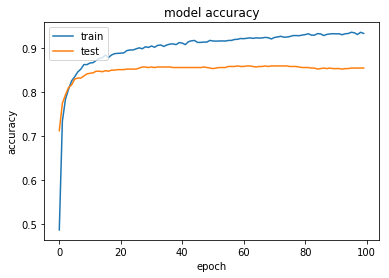

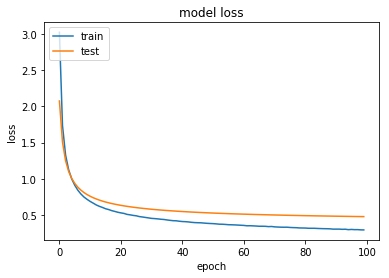

In [41]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

* **小结：**

 1. 添加dropout层可以很有效的避免模型过拟合；
 2. 添加batch normalization层可以降低Covariate Shift并加速运算过程，也能带来一些降低过拟合的效果；
 3. 尝试使用不同的优化器，如Adam和Adagrad；
 4. 数据增强（data augmentation）也可以增加模型的鲁棒性和泛化能力。
 5. 在使用Xception和ResNet时，因为它们的原模型最后只有一层GAP层+输出层，且模型卷积部分非常深，所以这一类模型在迁移学习时一般只用GAP加一层输出层就可以了，如果额外添加过多的全连接层反而使模型复杂度上升，效果并不好。
 6. 如果你使用的是VGG16和VGG19，相比Xception和ResNet，他们的卷积部分层数较浅，且原本的模型中，输出层之前使用了3层全连接层。所以在迁移学习时，如果只使用一层输出层效果可能并不好，最好是视具体情况再添加1-3层全连接层。

---

### 【练习】使用模型测试狗的品种


实现一个函数，它的输入为图像路径，功能为预测对应图像的类别，输出为你模型预测出的狗类别（`Affenpinscher`, `Afghan_hound` 等）。

与步骤5中的模拟函数类似，你的函数应当包含如下三个步骤：

1. 根据选定的模型载入图像特征（bottleneck features）
2. 将图像特征输输入到你的模型中，并返回预测向量。注意，在该向量上使用 argmax 函数可以返回狗种类的序号。
3. 使用在步骤0中定义的 `dog_names` 数组来返回对应的狗种类名称。

提取图像特征过程中使用到的函数可以在 `extract_bottleneck_features.py` 中找到。同时，他们应已在之前的代码块中被导入。根据你选定的 CNN 网络，你可以使用 `extract_{network}` 函数来获得对应的图像特征，其中 `{network}` 代表 `VGG19`, `Resnet50`, `InceptionV3`, 或 `Xception` 中的一个。
 
---

<a id='question9'></a>  

### __问题 9:__

In [42]:
### TODO: 写一个函数，该函数将图像的路径作为输入
### 然后返回此模型所预测的狗的品种
from extract_bottleneck_features import *

def Xception_predict_breed(img_path):
    # 提取bottleneck特征
    bottleneck_feature = extract_Xception(path_to_tensor(img_path))
    # 获取预测向量
    predicted_vector = Xception_model.predict(bottleneck_feature)
    # 返回此模型预测的狗的品种
    return dog_names[np.argmax(predicted_vector)]

def ResNet50_predict_breed(img_path):
    bottleneck_feature = extract_Resnet50(path_to_tensor(img_path))
    predicted_vector = ResNet50_model.predict(bottleneck_feature)
    return dog_names[np.argmax(predicted_vector)]

---

<a id='step6'></a>
## 步骤 6: 完成你的算法



实现一个算法，它的输入为图像的路径，它能够区分图像是否包含一个人、狗或两者都不包含，然后：

- 如果从图像中检测到一只__狗__，返回被预测的品种。
- 如果从图像中检测到__人__，返回最相像的狗品种。
- 如果两者都不能在图像中检测到，输出错误提示。

我们非常欢迎你来自己编写检测图像中人类与狗的函数，你可以随意地使用上方完成的 `face_detector` 和 `dog_detector` 函数。你__需要__在步骤5使用你的CNN来预测狗品种。

下面提供了算法的示例输出，但你可以自由地设计自己的模型！

![Sample Human Output](images/sample_human_output.png)




<a id='question10'></a>  

### __问题 10:__

在下方代码块中完成你的代码。

---


In [43]:
### TODO: 设计你的算法
### 自由地使用所需的代码单元数吧
def predict_label(img_path):
    from IPython.core.display import Image, display
    if dog_detector(img_path):
        print('\nhello, dog')
        display(Image(img_path,width=200,height=200))
        print("Your predicted breed is ... ")
        dog_name = Xception_predict_breed(img_path)
        return print(dog_name)
    elif face_detector(img_path):
        print('\nhello, human')
        display(Image(img_path,width=200,height=200))
        dog_name = Xception_predict_breed(img_path)
        print("You look like a ... ")
        return print(dog_name)
    else:
        print('\n')
        display(Image(img_path,width=200,height=200))
        return print("Sorry! Could not identify a human or dog in the chosen image. Please try again.")

---
<a id='step7'></a>
## 步骤 7: 测试你的算法

在这个部分中，你将尝试一下你的新算法！算法认为__你__看起来像什么类型的狗？如果你有一只狗，它可以准确地预测你的狗的品种吗？如果你有一只猫，它会将你的猫误判为一只狗吗？


<a id='question11'></a>  

### __问题 11:__

在下方编写代码，用至少6张现实中的图片来测试你的算法。你可以使用任意照片，不过请至少使用两张人类图片（要征得当事人同意哦）和两张狗的图片。
同时请回答如下问题：

1. 输出结果比你预想的要好吗 :) ？或者更糟 :( ？
2. 提出至少三点改进你的模型的想法。


hello, human


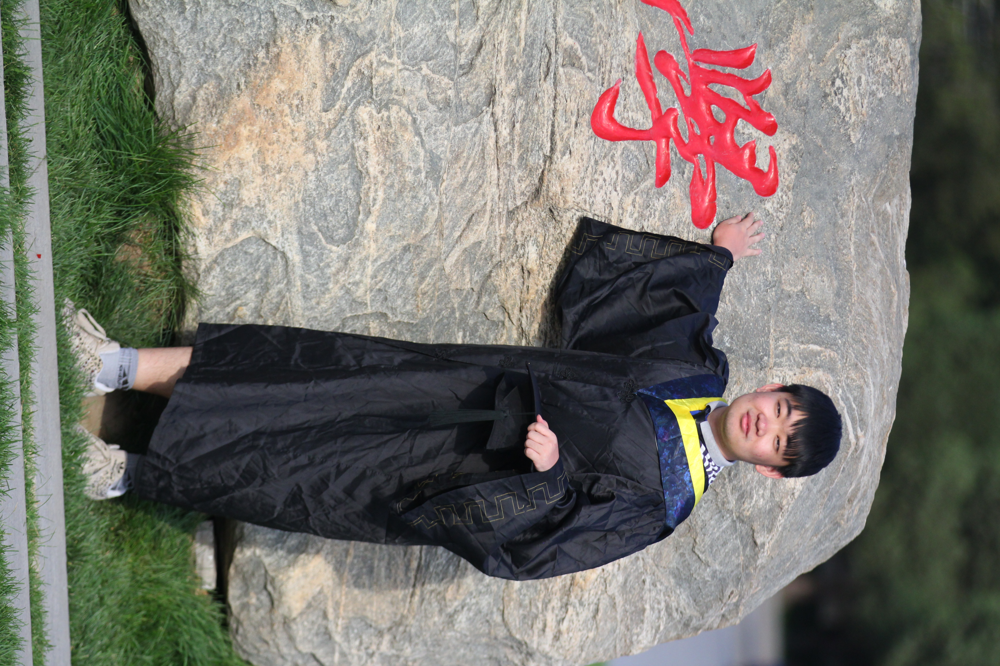

You look like a ... 
Dachshund

hello, dog


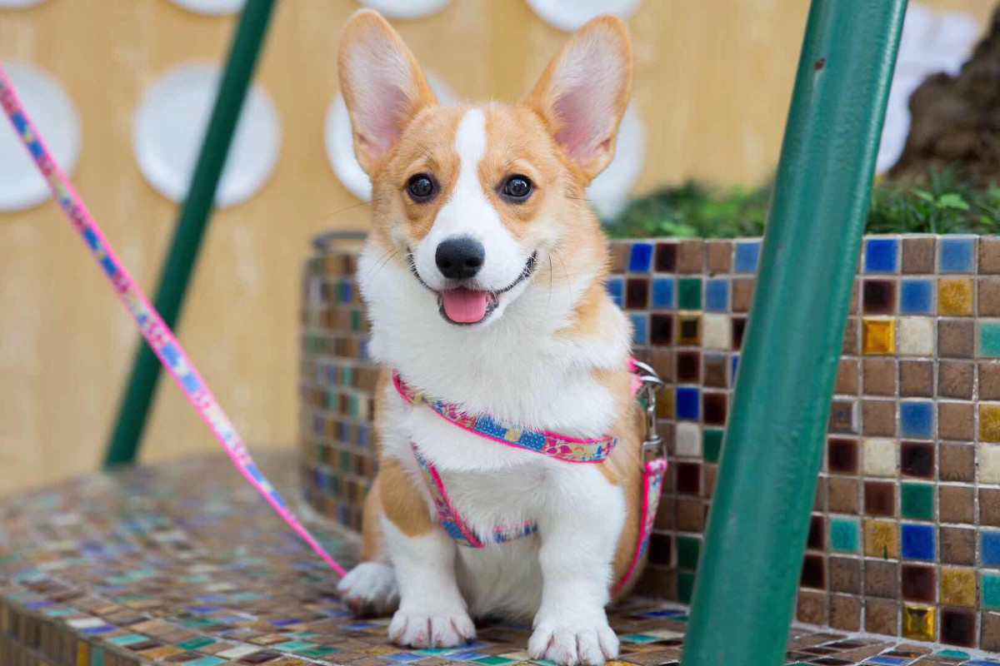

Your predicted breed is ... 
Pembroke_welsh_corgi

hello, dog


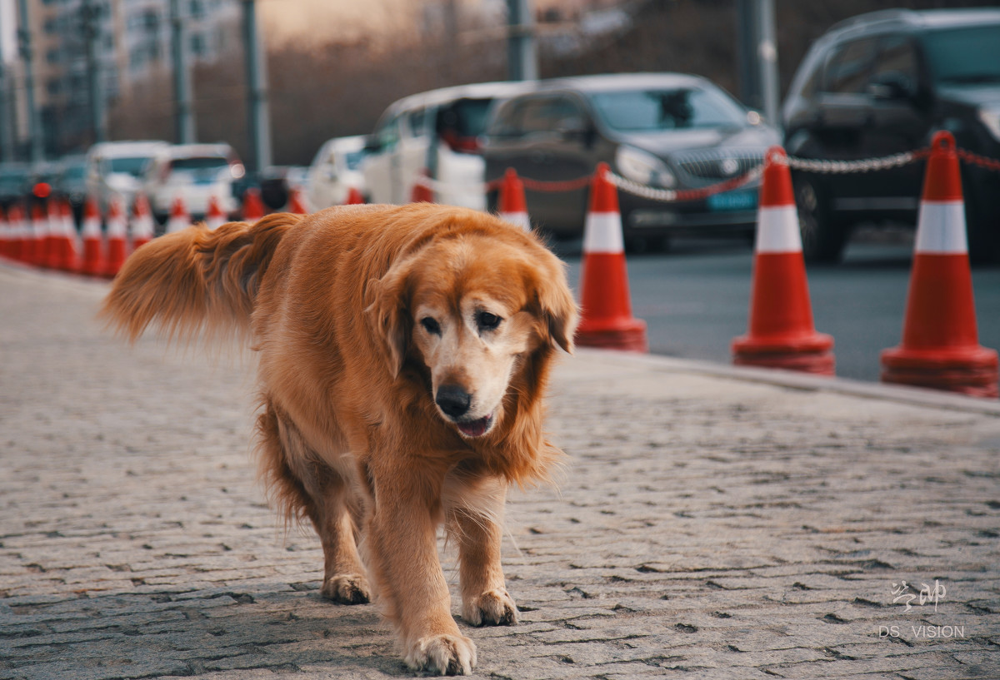

Your predicted breed is ... 
Golden_retriever

hello, dog


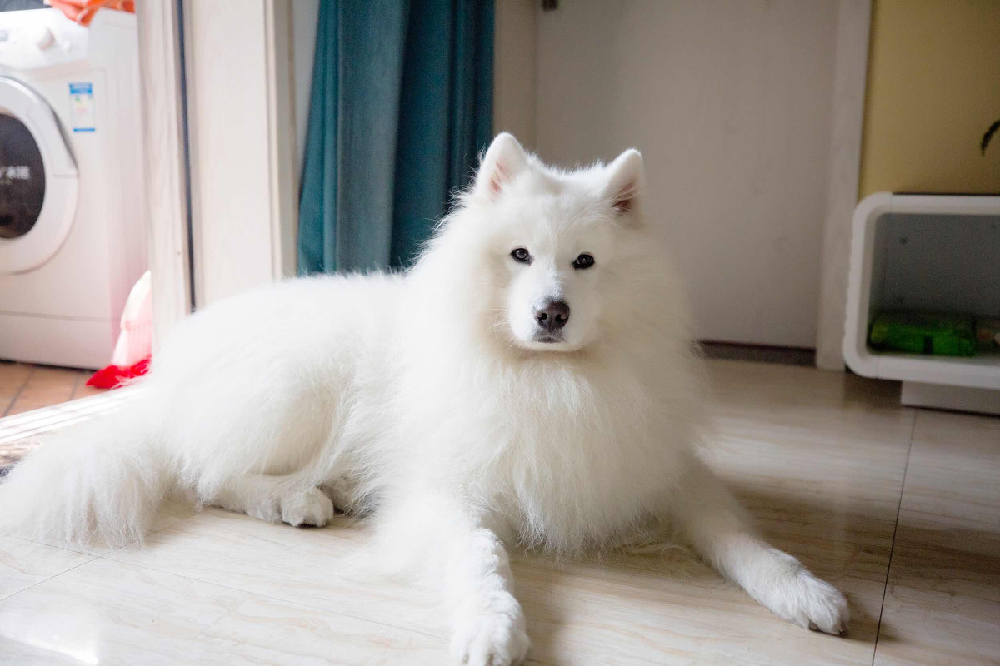

Your predicted breed is ... 
American_eskimo_dog




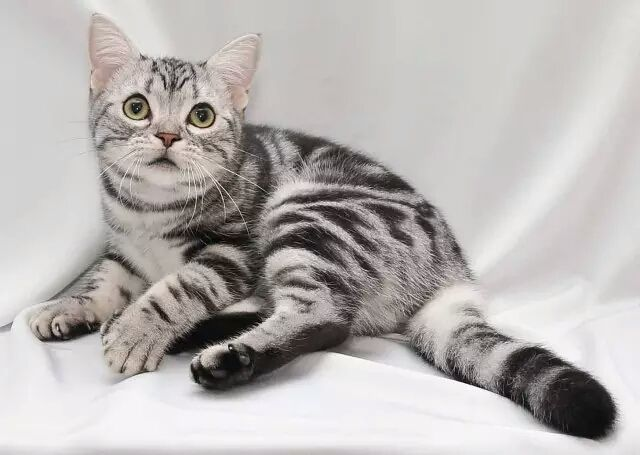

Sorry! Could not identify a human or dog in the chosen image. Please try again.

hello, human


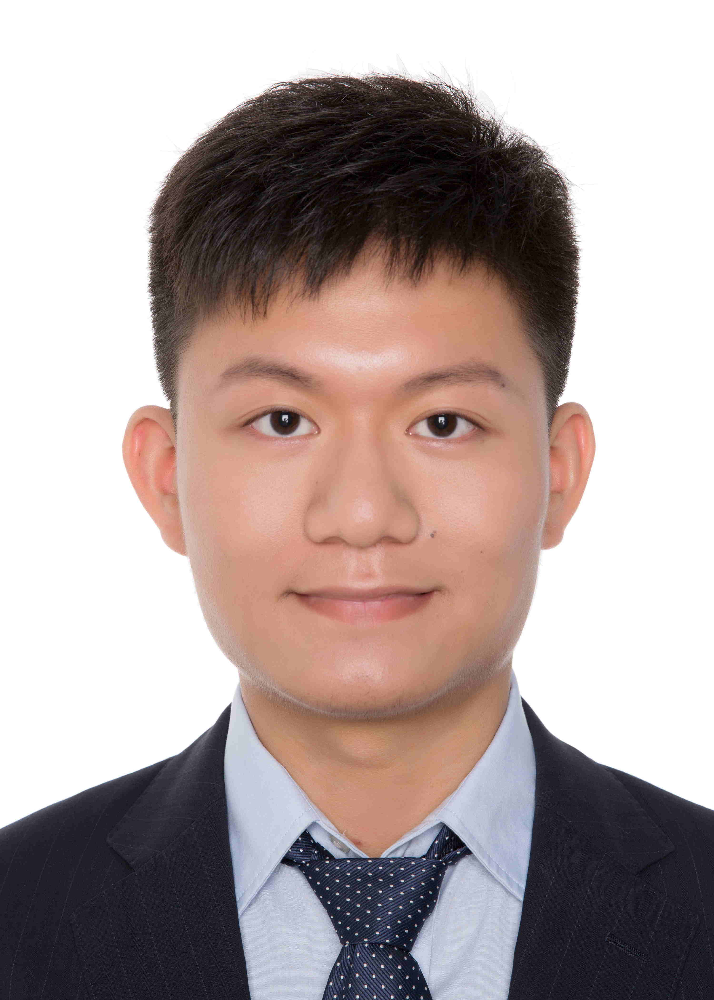

You look like a ... 
Petit_basset_griffon_vendeen

hello, dog


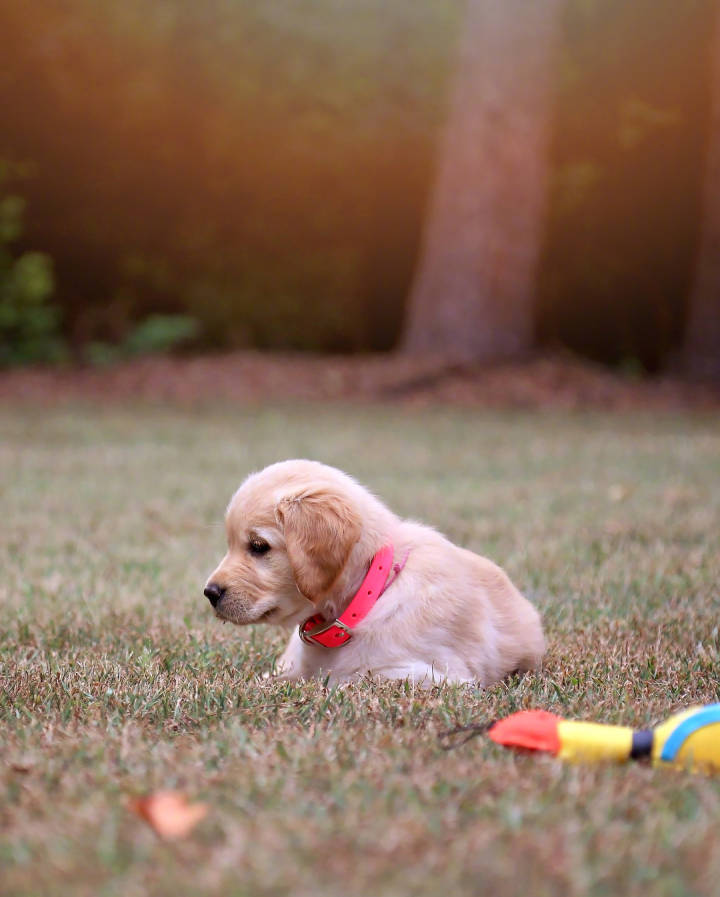

Your predicted breed is ... 
Golden_retriever


In [44]:
## TODO: 在你的电脑上，在步骤6中，至少在6张图片上运行你的算法。
## 自由地使用所需的代码单元数吧
my_data, my_targets = load_dataset('testImages')

for img_path in my_data:
    predict_label(img_path)

1. 输出结果比你预想的要好吗 :) ？或者更糟 :( ？
2. 提出至少三点改进你的模型的想法。

**回答：**
1. 输出结果比我预想的要好，使用猫的图片时，算法能够准确的给出既不是人也不是狗的结果；
2. 改进思路：
  * 1） 对数据集进行数据增强，优化模型的表现
  * 2） 使用多个模型的集成，选择投票率最高的结果
  * 3） 对神经网络结构进行优化


* **小结：**


 1. **交叉验证（Cross Validation）**

    在本次训练中，我们只进行了一次训练集/测试集切分，而在实际模型训练过程中，我们往往是使用交叉验证（Cross Validation）来进行模型选择（Model Selection）和调参（Parameter Tunning）的。交叉验证的通常做法是，按照某种方式多次进行训练集/测试集切分，最终取平均值（加权平均值），具体可以参考[维基百科](https://en.wikipedia.org/wiki/Cross-validation_(statistics))的介绍。


 2. **模型融合/集成学习（Model Ensembling）**

    通过利用一些机器学习中模型融合的技术，如voting、bagging、blending以及staking等，可以显著提高模型的准确率与鲁棒性，且几乎没有风险。你可以参考整理的机器学习笔记中的[Ensemble](https://github.com/LeanderLXZ/machine-learning-notes#step5)部分。


 3. **更多的数据**

    对于深度学习（机器学习）任务来说，更多的数据意味着更为丰富的输入空间，可以带来更好的训练效果。我们可以通过数据增强（Data Augmentation）、[对抗生成网络（Generative Adversarial Networks）](https://www.ams.giti.waseda.ac.jp/data/pdf-files/2017_IEVC_watabe.pdf)等方式来对数据集进行扩充，同时这种方式也能提升模型的鲁棒性。


 4. **更换人脸检测算法**

    尽管OpenCV工具包非常方便并且高效，Haar级联检测也是一个可以直接使用的强力算法，但是这些算法仍然不能获得很高的准确率，并且需要用户提供正面照片，这带来的一定的不便。所以如果想要获得更好的用户体验和准确率，我们可以尝试一些新的人脸识别算法，如基于深度学习的一些算法。


 5. **多目标监测**

    更进一步，我们可以通过一些先进的目标识别算法，如RCNN、Fast-RCNN、Faster-RCNN或Masked-RCNN等，来完成一张照片中同时出现多个目标的检测任务。

**注意: 当你写完了所有的代码，并且回答了所有的问题。你就可以把你的 iPython Notebook 导出成 HTML 文件。你可以在菜单栏，这样导出File -> Download as -> HTML (.html)把这个 HTML 和这个 iPython notebook 一起做为你的作业提交。**